In [4]:
import os
import lime
import time
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import multiprocessing as mp

from functools import partial
from tensorflow import keras
from tensorboard.plugins import projector
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics import (precision_score, recall_score,
                             accuracy_score, confusion_matrix, ConfusionMatrixDisplay)
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer

In [5]:
print(tf.__version__)
print(tf.config.list_physical_devices("GPU"))
print(os.getcwd())
os.chdir("/tf")
print(os.getcwd())

2.7.0
[]
/Users/tegochang/Desktop/MIDS/courses/703_NLP/finalproject/Final project/notebooks


FileNotFoundError: [Errno 2] No such file or directory: '/tf'

# Data

## Data Loading

In [9]:
data = pd.read_csv("../Tego's Review/train.csv", usecols=list(range(1, 8)))
data.head()

,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0
1,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0
2,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0
3,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0
4,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0


In [10]:
print(data.shape)

(159571, 7)


**From the table below it can be seen that the data set is highly unbalanced:**

In [11]:
cols = data.columns[1:]
for col in cols:
    print(data[col].value_counts(normalize=True))
    print("*" * 30)

0    0.904156
1    0.095844
Name: toxic, dtype: float64
******************************
0    0.990004
1    0.009996
Name: severe_toxic, dtype: float64
******************************
0    0.947052
1    0.052948
Name: obscene, dtype: float64
******************************
0    0.997004
1    0.002996
Name: threat, dtype: float64
******************************
0    0.950636
1    0.049364
Name: insult, dtype: float64
******************************
0    0.991195
1    0.008805
Name: identity_hate, dtype: float64
******************************


In [17]:
(data
 .groupby(['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate'], as_index=False)
 .count()
 .rename(columns={"comment_text": "number of rows"})
 .sort_values(by='number of rows', ascending=False)
 )

,toxic,severe_toxic,obscene,threat,insult,identity_hate,number of rows
0,0,0,0,0,0,0,143346
12,1,0,0,0,0,0,5666
22,1,0,1,0,1,0,3800
20,1,0,1,0,0,0,1758
14,1,0,0,0,1,0,1215
36,1,1,1,0,1,0,989
23,1,0,1,0,1,1,618
6,0,0,1,0,0,0,317
2,0,0,0,0,1,0,301
37,1,1,1,0,1,1,265


In [34]:
data.shape

(159571, 7)

In [18]:
# Creating unique target combinations for the mapping purpose
col_names = data.columns[1:]
target_combinations = pd.DataFrame(np.unique(data.iloc[:, 1:], axis=0), columns=col_names)
target_combinations['target_class'] = np.arange(target_combinations.shape[0])
target_combinations.head()

,toxic,severe_toxic,obscene,threat,insult,identity_hate,target_class
0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,1
2,0,0,0,0,1,0,2
3,0,0,0,0,1,1,3
4,0,0,0,1,0,0,4


In [35]:
# Creating additional column "target_class" for Naive Bayes model:
data = pd.merge(data, target_combinations,
                on=['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate'])
data.head()

,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,target_class
0,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0,0
1,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0,0
2,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0,0
3,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0,0
4,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0,0


## Data Split

In [36]:
train_df, valid_df = train_test_split(data, train_size=0.9, random_state=1234)
valid_df, test_df = train_test_split(valid_df, train_size=0.5, random_state=1234)
print(train_df.shape)
print(valid_df.shape)
print(test_df.shape)

(143613, 8)
(7979, 8)
(7979, 8)


# Multinomial Naive Bayes classifier
## Step2

## Data preparation

In [39]:
# See the vocabulary 
word_counts = CountVectorizer()
word_counts.fit(train_df.comment_text.to_numpy())

CountVectorizer()

In [44]:
len(word_counts.get_feature_names_out())

177603

In [53]:
vocab = word_counts.vocabulary_
vocab

{'other': 114539,
 'diseases': 49043,
 'and': 15084,
 'misfortunes': 102579,
 'who': 169577,
 'must': 105853,
 'wait': 167527,
 'as': 18496,
 'poor': 122001,
 'servant': 140033,
 'with': 171167,
 'money': 103743,
 'property': 124764,
 'everything': 57662,
 'have': 72545,
 'wish': 171110,
 'they': 155544,
 'were': 168929,
 'in': 78903,
 'hell': 73272,
 'the': 154898,
 'jews': 84394,
 'whomsoever': 169611,
 'would': 171992,
 'like': 93224,
 'to': 157062,
 'them': 155162,
 'not': 110494,
 'making': 96884,
 'any': 16275,
 'accusations': 10329,
 'of': 112296,
 'sockpuppetry': 144669,
 'are': 17560,
 'you': 173996,
 'seriously': 139980,
 'saying': 137428,
 'that': 154846,
 'blocked': 26357,
 'me': 99622,
 'for': 62825,
 'posting': 122430,
 'diff': 48051,
 'but': 30201,
 'also': 14060,
 'now': 110818,
 'telling': 153926,
 'shouldn': 141686,
 'post': 122376,
 'it': 82743,
 'talk': 152597,
 'lack': 90621,
 'neutrality': 108471,
 'there': 155358,
 'is': 82339,
 'disproportional': 49380,
 'amount

In [54]:
vocab = dict(sorted(vocab.items(), key=lambda item: item[1]))
print("Total vocab in the data set:", len(vocab))

Total vocab in the data set: 177603


In [55]:
# Print the most rare words/symbols in the vocab:
for idx, (k, v) in enumerate(vocab.items(), 1):
    print(k, ":", v)
    if idx % 50 == 0:
        break

00 : 0
000 : 1
0000 : 2
00000 : 3
000000 : 4
0000000 : 5
00000000 : 6
0000000027 : 7
000001 : 8
000002 : 9
000002000004000008000016 : 10
0000030422 : 11
0000035 : 12
000023405011 : 13
00004 : 14
000045 : 15
00007632 : 16
000080 : 17
00008b : 18
00009c : 19
0000z : 20
0001 : 21
000111002 : 22
00012 : 23
000131088 : 24
0002tree : 25
0003 : 26
000319821 : 27
00033 : 28
00035 : 29
000352 : 30
00037 : 31
00038 : 32
0004 : 33
000500 : 34
00053 : 35
0006 : 36
00075 : 37
00098 : 38
000_bucks : 39
000b01c5b9f8 : 40
000feet : 41
000ft : 42
000http : 43
000k : 44
000kg : 45
000km : 46
000lb : 47
000poland2 : 48
000s : 49


In [56]:
# Create tf-idf vectorizer with limited vocab:
tf_idf = TfidfVectorizer(max_features=20_000)
tf_idf.fit(train_df.comment_text.to_numpy())

TfidfVectorizer(max_features=20000)

In [57]:
# Transform text to vectors:
X_train = tf_idf.transform(train_df.comment_text.to_numpy())
X_valid = tf_idf.transform(valid_df.comment_text.to_numpy())
X_test = tf_idf.transform(test_df.comment_text.to_numpy())

y_train = train_df.iloc[:, -1].to_numpy()
y_valid = valid_df.iloc[:, -1].to_numpy()
y_test = test_df.iloc[:, -1].to_numpy()

print(X_train.shape, X_valid.shape, X_test.shape)
print(y_train.shape, y_valid.shape, y_test.shape)

(143613, 20000) (7979, 20000) (7979, 20000)
(143613,) (7979,) (7979,)


## Model train

In [58]:
nb = MultinomialNB()
nb.fit(X_train, y_train)

MultinomialNB()

In [63]:
nb_preds = nb.predict(X_valid)

In [64]:
# define the baseline by shuffling
np.random.seed(1234)
y_valid_sh = y_valid.copy()
np.random.shuffle(y_valid_sh)

## Model assessment

In [65]:
print("Naive Bayes accuracy:", accuracy_score(y_valid, nb_preds))
print("Baseline accuracy:", accuracy_score(y_valid, y_valid_sh))
print("*" * 50)
print("Naive Bayes precision:", precision_score(y_valid, nb_preds,
                                                average='weighted', zero_division=1))
print("Baseline precision:", precision_score(y_valid, y_valid_sh,
                                             average='weighted', zero_division=1))
print("*" * 50)
print("Naive Bayes recall:", recall_score(y_valid, nb_preds, average='weighted'))
print("Baseline recall:", recall_score(y_valid, y_valid_sh, average='weighted'))

Naive Bayes accuracy: 0.9044993106905628
Baseline accuracy: 0.8046121067802983
**************************************************
Naive Bayes precision: 0.8672470408700179
Baseline precision: 0.8046121067802983
**************************************************
Naive Bayes recall: 0.9044993106905628
Baseline recall: 0.8046121067802983


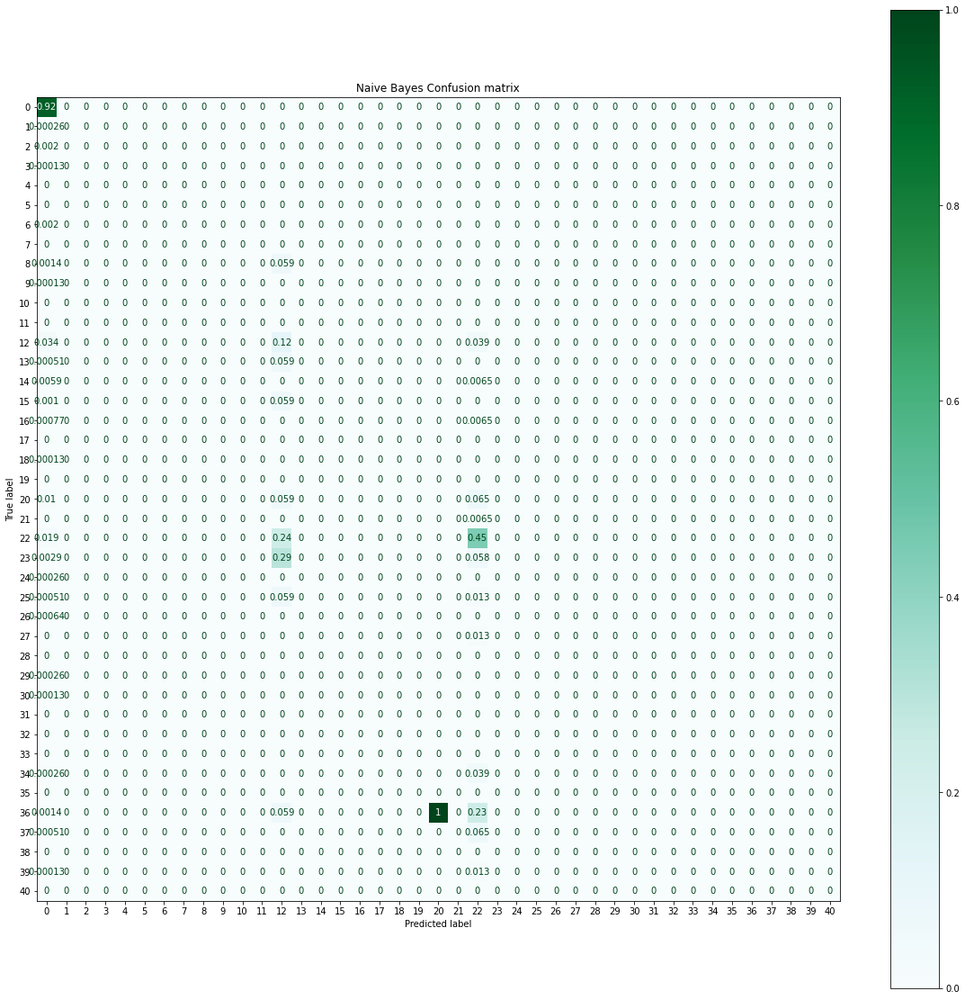

In [66]:
conf_matrix = confusion_matrix(y_valid, nb_preds, labels=nb.classes_, normalize='pred')
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=nb.classes_, )
fig, ax = plt.subplots(figsize=(20, 20))
plt.title("Naive Bayes Confusion matrix")
disp.plot(ax=ax, cmap='BuGn')
plt.savefig("naive_b_conf_m.jpg")
plt.show()

In [67]:
# The model often misclassifies 22 class with 36:
target_combinations.iloc[[12, 22, 36]]

,toxic,severe_toxic,obscene,threat,insult,identity_hate,target_class
12,1,0,0,0,0,0,12
22,1,0,1,0,1,0,22
36,1,1,1,0,1,0,36


Overall, many classes are under-represented and the model have a hard time to make good predictions on many of them. It can only catch class 0, which is no surprise as the data set consists mainly of this class and some predictions of the class 22. Therefore, generating all classes with this model would be problematic.

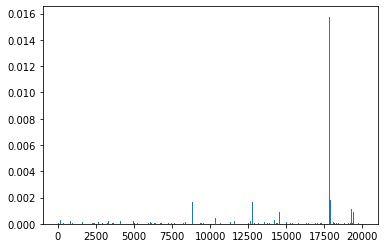

In [70]:
# NB model distribution of words of class 0 - neutral comments:
plt.bar(range(20000), np.exp(nb.feature_log_prob_)[0])
plt.show()

In [73]:
nb_weights = np.exp(nb.feature_log_prob_)
nb_weights_0 = list(zip(enumerate(nb_weights[0])))
nb_weights_22 = list(zip(enumerate(nb_weights[22])))
nb_weights_12 = list(zip(enumerate(nb_weights[12])))
nb_weights_36 = list(zip(enumerate(nb_weights[36])))



nb_weights_0 = sorted(nb_weights_0, key=lambda x: x[0][1], reverse=True)
nb_weights_22 = sorted(nb_weights_22, key=lambda x: x[0][1], reverse=True)
nb_weights_12 = sorted(nb_weights_12, key=lambda x: x[0][1], reverse=True)
nb_weights_36 = sorted(nb_weights_36, key=lambda x: x[0][1], reverse=True)

In [77]:
len(nb_weights_12)
len(nb_weights)
len(nb_weights[0])

20000

In [78]:
# Most probable words from class 0, 22 and 12:
tf_idf_vocab = tf_idf.get_feature_names_out()
print("class 0:", [tf_idf_vocab[x[0][0]] for x in nb_weights_0[:15]])
print("class 12:", [tf_idf_vocab[x[0][0]] for x in nb_weights_12[:15]])
print("class 22:", [tf_idf_vocab[x[0][0]] for x in nb_weights_22[:15]])
print("class 36:", [tf_idf_vocab[x[0][0]] for x in nb_weights_36[:15]])

class 0: ['the', 'to', 'you', 'of', 'and', 'is', 'it', 'that', 'in', 'for', 'this', 'not', 'on', 'be', 'as']
class 12: ['you', 'the', 'and', 'to', 'is', 'your', 'of', 'are', 'it', 'me', 'that', 'my', 'this', 'not', 'in']
class 22: ['you', 'fuck', 'fucking', 'your', 'the', 'and', 'to', 'are', 'bitch', 'shit', 'suck', 'is', 'my', 'asshole', 'me']
class 36: ['fuck', 'you', 'fucking', 'bitch', 'shit', 'suck', 'asshole', 'go', 'cunt', 'your', 'dick', 'ass', 'my', 'off', 'and']


In [87]:
t1 = [test_df[test_df['target_class'] == 22]['comment_text'].iloc[2]]
t1[0]

'DMacks is a fucking faggot \n\nYou heard. Faggot.'

In [88]:
pipeline = make_pipeline(tf_idf, nb)

In [89]:
nb.classes_

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40])

In [90]:
expl = LimeTextExplainer(class_names=nb.classes_)

In [91]:
exp = expl.explain_instance(t1[0], pipeline.predict_proba, num_features=5, labels=[0, 22])

In [93]:
exp.show_in_notebook(text=True)

In [95]:
t1 = [test_df[test_df['target_class'] == 0]['comment_text'].iloc[5]]
t1[0]

"Appeal to Arbitration possibility\nTo Guy, I do not like you blocking me in violation of my legal free speech rights, notwithstanding Wikipedia policy to the contrary. I may therefor appeal to Arbitration Committee for review of your judgment. Beyond that I don't know, I'll just check all my other options. I'm usually forgiving, but at this point I don't see how I can do so eaisily for the wrong you did to me."

In [96]:
exp = expl.explain_instance(t1[0], pipeline.predict_proba, num_features=5, top_labels=4)

In [97]:
exp.show_in_notebook(text=True)

As expected the model is very confident on class 0 - normal comments

# Multinomial Naive Bayes classifier
## Step 4: Data Generation

For the purpose of model generation, let's simplify task to binary classification and group all abusive comments together.

In [29]:
# Create new column "abusive_comment": if sum of 6 columns > 0 then 1 else 0:
data['abusive_comment'] = np.where(np.sum(data.iloc[:, 1:7].to_numpy(), axis=1) > 0, 1, 0)
data.head()

,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,target_class,abusive_comment
0,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0,0,0
1,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0,0,0
2,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0,0,0
3,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0,0,0
4,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0,0,0


In [36]:
# Proportion of the new variable:
data.abusive_comment.value_counts(normalize=True)

0    0.898321
1    0.101679
Name: abusive_comment, dtype: float64

In [37]:
# Sampling non-abusive comments for the undersampling purpose:
abusive_df = data[data['abusive_comment'] == 1][["comment_text", "abusive_comment"]].copy()
non_abusive_df = data[data['abusive_comment'] == 0][["comment_text", "abusive_comment"]].copy()
non_abusive_df = non_abusive_df.sample(n=20_000)

In [38]:
sample_df = (pd.concat([abusive_df, non_abusive_df])
             .sample(frac=1)
             .reset_index()
             .drop("index", axis=1))
sample_df.head()

,comment_text,abusive_comment
0,u fucking cunt\nrevert smosh movie now or ill ...,1
1,"""\n I had cupcakes for Christmas, take one fo...",0
2,"shut the fuck up. if you were not a moron, you...",1
3,"""while my block log says """"disruptive editing""...",0
4,OsFan \n\ni still think you're a piece of sh!t.,1


In [39]:
sample_train_df, sample_valid_df = train_test_split(sample_df, test_size=0.1, random_state=1234)

In [40]:
tf_idf = TfidfVectorizer(max_features=20_000)
tf_idf.fit(sample_train_df.comment_text.to_numpy())

TfidfVectorizer(max_features=20000)

In [41]:
x_train = tf_idf.transform(sample_train_df.comment_text.to_numpy())
x_valid = tf_idf.transform(sample_valid_df.comment_text.to_numpy())

y_train = sample_train_df.abusive_comment.to_numpy()
y_valid = sample_valid_df.abusive_comment.to_numpy()

In [42]:
nb = MultinomialNB()
nb.fit(x_train, y_train)
nb_preds = nb.predict(x_valid)

In [43]:
print(accuracy_score(y_valid, nb_preds))
print(precision_score(y_valid, nb_preds))
print(recall_score(y_valid, nb_preds))

0.8890422301959702
0.9063719115734721
0.8438256658595642


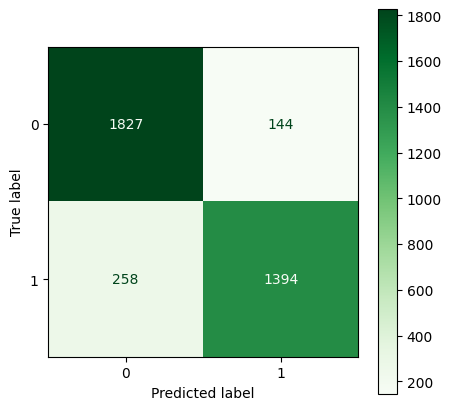

In [44]:
conf_matrix = confusion_matrix(y_valid, nb_preds, labels=nb.classes_)
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=nb.classes_, )
fig, ax = plt.subplots(figsize=(5, 5))
disp.plot(ax=ax, cmap='Greens')
plt.show()

In [45]:
pipeline = make_pipeline(tf_idf, nb)
expl = LimeTextExplainer(class_names=nb.classes_)

In [49]:
t1 = sample_valid_df[sample_valid_df['abusive_comment'] == 0]['comment_text'].iloc[3]
t2 = sample_valid_df[sample_valid_df['abusive_comment'] == 1]['comment_text'].iloc[3]

print(t1)
print("*" * 50)
print(t2)

Information about the articles
**************************************************
Covers 

Fuck! I have a cover by Deep Purple and Children O fBodom also. If it's not Children of Bodom, then who the fuck was that? I still have the song. The vocals and everything are so much like Children O fBodom. Do some research on that guys. Also see if Deep Purple did that. I have that one too.


In [50]:
exp = expl.explain_instance(t1, pipeline.predict_proba, num_features=8)
exp.show_in_notebook(text=True)

In [51]:
exp = expl.explain_instance(t2, pipeline.predict_proba, num_features=8)
exp.show_in_notebook(text=True)

In [52]:
distr = np.exp(nb.feature_log_prob_)
print(distr.shape)

(2, 20000)


In [173]:
# Create new column "text_len" to sample from it during sentence generating process:
sample_train_df['text_len'] = sample_train_df.comment_text.apply(lambda x: len(x))

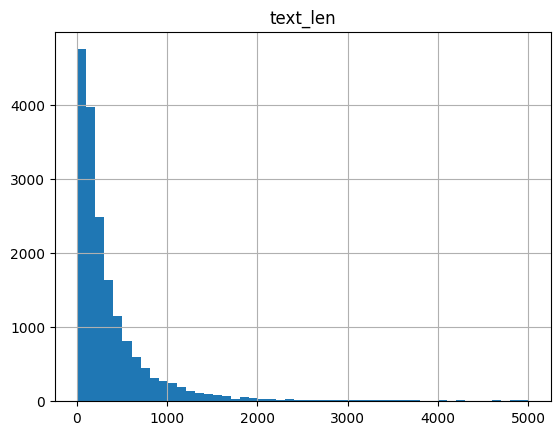

In [176]:
sample_train_df[sample_train_df['abusive_comment'] == 0][['text_len']].hist(bins=50)
plt.show()

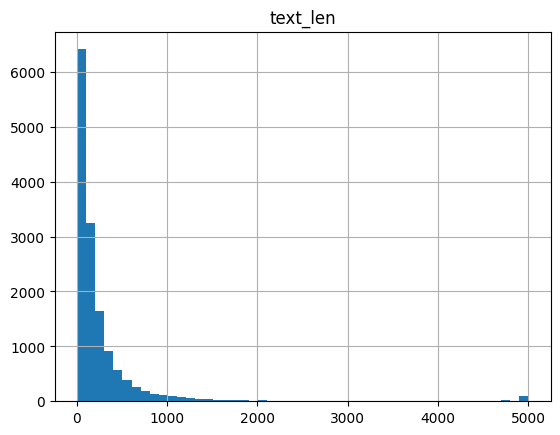

In [177]:
sample_train_df[sample_train_df['abusive_comment'] == 1][['text_len']].hist(bins=50)
plt.show()

In [237]:
nr_examples = 5000
text_len = np.random.choice(sample_train_df.text_len.to_numpy(), size=nr_examples)


def gen_text(ind, tl):
    p = np.argmax(np.random.dirichlet(distr[ind], tl), axis=1)
    s = tf_idf.get_feature_names_out()[p]
    sentence = ' '.join(word for word in s)
    return sentence

In [238]:
# Takes around 6 minutes with 6 cores:
start = time.time()
pool = mp.Pool(processes=6)
normal_comments = pool.map(partial(gen_text, 0), text_len)
print(time.time() - start, " seconds")
abusive_comments = pool.map(partial(gen_text, 1), text_len)

384.2987458705902  seconds


In [242]:
gen_data = pd.concat([pd.DataFrame({"comment": normal_comments, "label": 0}),
                      pd.DataFrame({"comment": abusive_comments, "label": 1})])

In [244]:
#gen_data.to_csv("./models/data/gen_data.csv", index=False)

In [53]:
gen_data = pd.read_csv("./models/data/gen_data.csv")
gen_data.head()

,comment,label
0,other gets should from rsf talk discussion min...,0
1,as ff hardly minor load kidding would ask offs...,0
2,accomplishment be it irrationality languages f...,0
3,political let see fitness episode textbooks qu...,0
4,150 incorrect disruption editions are cults or...,0


# Fully connected neural network

## TF-IDF Vectorization with dimension reduction

In [3]:
data = pd.read_csv("./models/data/train.csv", usecols=list(range(1, 8)))
train_df, valid_df = train_test_split(data, train_size=0.9, random_state=1234)
valid_df, test_df = train_test_split(valid_df, train_size=0.5, random_state=1234)

In [4]:
# TF-IDF vectorization:
tf_idf = TfidfVectorizer()
X_train = tf_idf.fit_transform(train_df.comment_text.to_numpy())
X_valid = tf_idf.transform(valid_df.comment_text.to_numpy())
X_test = tf_idf.transform(test_df.comment_text.to_numpy())

y_train = train_df.iloc[:, 1:].to_numpy()
y_valid = valid_df.iloc[:, 1:].to_numpy()
y_test = test_df.iloc[:, 1:].to_numpy()

print(X_train.shape, X_valid.shape, X_test.shape)
print(y_train.shape, y_valid.shape, y_test.shape)

(143613, 177889) (7979, 177889) (7979, 177889)
(143613, 6) (7979, 6) (7979, 6)


In [69]:
# Dimension reduction. From 177889 to 300:
pca_300 = TruncatedSVD(n_components=300, n_iter=5, random_state=1234)
X_300_train = pca_300.fit_transform(X_train)
X_300_valid = pca_300.transform(X_valid)
X_300_test = pca_300.transform(X_test)
print(X_300_train.shape)
print(X_300_valid.shape)
print(X_300_test.shape)

(143613, 300)
(7979, 300)
(7979, 300)


In [9]:
# Model definition:
model = keras.Sequential(name='Simple_FCNN')
model.add(keras.layers.Dense(300, activation='relu', input_shape=(300,)))
model.add(keras.layers.Dense(150, activation='relu'))
model.add(keras.layers.Dense(6, activation='sigmoid'))
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=[keras.metrics.Precision(),
                       keras.metrics.Recall(),
                       keras.metrics.BinaryAccuracy()])
model.summary()

Model: "Simple_FCNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 300)               90300     
                                                                 
 dense_1 (Dense)             (None, 150)               45150     
                                                                 
 dense_2 (Dense)             (None, 6)                 906       
                                                                 
Total params: 136,356
Trainable params: 136,356
Non-trainable params: 0
_________________________________________________________________


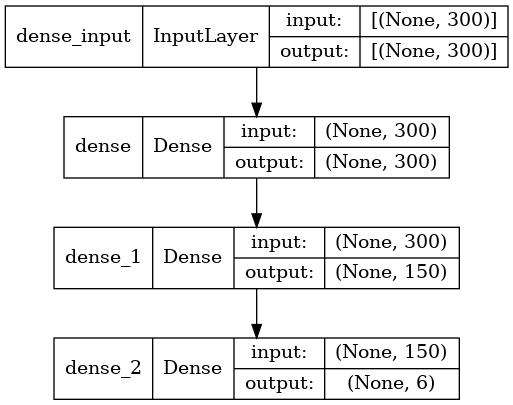

In [10]:
keras.utils.plot_model(model, show_shapes=True)

In [6]:
epoch = 5
batch_size = 32

In [11]:
# Model train:
callback = [
    keras.callbacks.ModelCheckpoint("./models/data/fcnn_300.keras",
                                    save_best=True,
                                    monitor='val_recall')
]
history = model.fit(X_300_train, y_train,
                    validation_data=(X_300_valid, y_valid),
                    epochs=epoch,
                    callbacks=callback,
                    batch_size=batch_size)

Epoch 1/5
4488/4488 [==============================] - 11s 2ms/step - loss: 0.0680 - precision: 0.8144 - recall: 0.5219 - binary_accuracy: 0.9780 - val_loss: 0.0559 - val_precision: 0.8299 - val_recall: 0.5536 - val_binary_accuracy: 0.9812
Epoch 2/5
4488/4488 [==============================] - 9s 2ms/step - loss: 0.0576 - precision: 0.8274 - recall: 0.5852 - binary_accuracy: 0.9802 - val_loss: 0.0555 - val_precision: 0.8185 - val_recall: 0.5567 - val_binary_accuracy: 0.9810
Epoch 3/5
4488/4488 [==============================] - 10s 2ms/step - loss: 0.0543 - precision: 0.8320 - recall: 0.6095 - binary_accuracy: 0.9810 - val_loss: 0.0551 - val_precision: 0.7905 - val_recall: 0.6091 - val_binary_accuracy: 0.9815
Epoch 4/5
4488/4488 [==============================] - 10s 2ms/step - loss: 0.0514 - precision: 0.8355 - recall: 0.6303 - binary_accuracy: 0.9818 - val_loss: 0.0556 - val_precision: 0.8164 - val_recall: 0.5711 - val_binary_accuracy: 0.9813
Epoch 5/5
4488/4488 [====================

In [71]:
# Load the best model and evaluate on the test set:
model = keras.models.load_model("./models/data/fcnn_300.keras")
model.evaluate(X_300_test, y_test)

250/250 [==============================] - 1s 2ms/step - loss: 0.0606 - precision: 0.7892 - recall: 0.5846 - binary_accuracy: 0.9800


[0.0606466606259346,
 0.7892196178436279,
 0.5846245288848877,
 0.9799681305885315]

In [11]:
def plot_models_loss():
    plt.figure(figsize=(10, 7))
    plt.title("Training and validation loss")
    plt.plot(history.history['loss'], label='training loss')
    plt.plot(history.history['val_loss'], label='validation loss')
    plt.legend()
    plt.show()


plot_models_loss()

NameError: name 'history' is not defined

In [72]:
fcnn_300_pred = np.where(model.predict(X_300_test) >= 0.5, 1, 0)

In [73]:
# Column-wise assessment:
col_names = data.columns[1:]
y_test_copy = y_test.copy()
np.random.shuffle(y_test_copy)


def column_wise_metrics(preds):
    print("Models accuracy vs baseline accuracy")
    for i in range(6):
        acc = accuracy_score(y_test[:, i], preds[:, i])
        baseline_acc = accuracy_score(y_test_copy[:, i], preds[:, i])
        print(f"{col_names[i]}: {acc} vs {baseline_acc}")

    print("*" * 80)
    print("Models precision vs baseline precision")
    for i in range(6):
        prec = precision_score(y_test[:, i], preds[:, i])
        baseline_prec = precision_score(y_test_copy[:, i], preds[:, i])
        print(f"{col_names[i]}: {prec} vs {baseline_prec}")

    print("*" * 80)
    print("Model's recall vs baseline recall")
    for i in range(6):
        rec = recall_score(y_test[:, i], preds[:, i])
        baseline_rec = recall_score(y_test_copy[:, i], preds[:, i])
        print(f"{col_names[i]}: {rec} vs {baseline_rec}")


column_wise_metrics(fcnn_300_pred)

Models accuracy vs baseline accuracy
toxic: 0.9526256423110665 vs 0.8518611354806367
severe_toxic: 0.9888457200150395 vs 0.983832560471237
obscene: 0.9785687429502444 vs 0.9133976688808121
threat: 0.9962401303421481 vs 0.9947361824790074
insult: 0.9718009775661111 vs 0.9189121443789948
identity_hate: 0.991728286752726 vs 0.9902243388895852
********************************************************************************
Models precision vs baseline precision
toxic: 0.8351851851851851 vs 0.09074074074074075
severe_toxic: 0.40816326530612246 vs 0.0
obscene: 0.8440366972477065 vs 0.04892966360856269
threat: 0.46153846153846156 vs 0.0
insult: 0.7375415282392026 vs 0.036544850498338874
identity_hate: 0.46153846153846156 vs 0.0
********************************************************************************
Model's recall vs baseline recall
toxic: 0.6094594594594595 vs 0.06621621621621622
severe_toxic: 0.25 vs 0.0
obscene: 0.696969696969697 vs 0.04040404040404041
threat: 0.20689655172413793 v

## Bag of words with reduced vocabulary (multi-hot encoded)

In [7]:
# Create tf.Dataset:
x_train = train_df.comment_text.to_numpy()
x_valid = valid_df.comment_text.to_numpy()
x_test = test_df.comment_text.to_numpy()

train_ds = tf.data.Dataset.from_tensor_slices((x_train, y_train)).batch(batch_size)
valid_ds = tf.data.Dataset.from_tensor_slices((x_valid, y_valid)).batch(batch_size)
test_ds = tf.data.Dataset.from_tensor_slices((x_test, y_test)).batch(batch_size)

### Unigram multi-hot encoded model

In [8]:
max_tokens = 10_000
text_vec = keras.layers.TextVectorization(
    max_tokens=max_tokens,
    output_mode="multi_hot"
)

text_only_train_ds = train_ds.map(lambda x, y: x)
text_vec.adapt(text_only_train_ds)

uni_train_ds = train_ds.map(lambda x, y: (text_vec(x), y),
                            num_parallel_calls=4)
uni_valid_ds = valid_ds.map(lambda x, y: (text_vec(x), y),
                            num_parallel_calls=4)
uni_test_ds = test_ds.map(lambda x, y: (text_vec(x), y),
                          num_parallel_calls=4)

In [16]:
# FCNN definition:
def fcnn_model():
    inputs = keras.Input(shape=(max_tokens,))
    x = keras.layers.Dense(64, activation='relu')(inputs)
    x = keras.layers.Dense(64, activation='relu')(x)
    output = keras.layers.Dense(6, activation='sigmoid')(x)
    model = keras.Model(inputs, output)
    model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=[keras.metrics.Precision(),
                           keras.metrics.Recall(),
                           keras.metrics.BinaryAccuracy()])
    return model

In [54]:
model = fcnn_model()
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 10000)]           0         
                                                                 
 dense_6 (Dense)             (None, 64)                640064    
                                                                 
 dense_7 (Dense)             (None, 64)                4160      
                                                                 
 dense_8 (Dense)             (None, 6)                 390       
                                                                 
Total params: 644,614
Trainable params: 644,614
Non-trainable params: 0
_________________________________________________________________


In [55]:
callback = [
    keras.callbacks.ModelCheckpoint("./models/data/fcnn_unigram.keras",
                                    save_best=True,
                                    monitor='val_recall')
]
history = model.fit(uni_train_ds.cache(),
                    validation_data=uni_valid_ds.cache(),
                    epochs=epoch,
                    callbacks=callback)

Epoch 1/5
4488/4488 [==============================] - 14s 3ms/step - loss: 0.0656 - precision_2: 0.8150 - recall_2: 0.5573 - binary_accuracy: 0.9790 - val_loss: 0.0499 - val_precision_2: 0.8413 - val_recall_2: 0.5916 - val_binary_accuracy: 0.9826
Epoch 2/5
4488/4488 [==============================] - 12s 3ms/step - loss: 0.0407 - precision_2: 0.8477 - recall_2: 0.7193 - binary_accuracy: 0.9849 - val_loss: 0.0518 - val_precision_2: 0.8038 - val_recall_2: 0.6384 - val_binary_accuracy: 0.9827
Epoch 3/5
4488/4488 [==============================] - 12s 3ms/step - loss: 0.0309 - precision_2: 0.8766 - recall_2: 0.7984 - binary_accuracy: 0.9884 - val_loss: 0.0614 - val_precision_2: 0.7786 - val_recall_2: 0.6490 - val_binary_accuracy: 0.9821
Epoch 4/5
4488/4488 [==============================] - 12s 3ms/step - loss: 0.0236 - precision_2: 0.9031 - recall_2: 0.8535 - binary_accuracy: 0.9912 - val_loss: 0.0725 - val_precision_2: 0.7715 - val_recall_2: 0.6440 - val_binary_accuracy: 0.9817
Epoch 5/

In [76]:
model = keras.models.load_model("./models/data/fcnn_unigram.keras")
model.evaluate(uni_test_ds)

250/250 [==============================] - 1s 2ms/step - loss: 0.0956 - precision_2: 0.7089 - recall_2: 0.6633 - binary_accuracy: 0.9787


[0.09562557190656662,
 0.7089172005653381,
 0.6632896065711975,
 0.9786524176597595]

In [77]:
fcnn_unigram_pred = np.where(model.predict(uni_test_ds) >= 0.5, 1, 0)

In [78]:
column_wise_metrics(fcnn_unigram_pred)

Models accuracy vs baseline accuracy
toxic: 0.9532522872540419 vs 0.8374483017922045
severe_toxic: 0.9893470359694198 vs 0.9830805865396667
obscene: 0.973806241383632 vs 0.9098884572001504
threat: 0.9967414462965284 vs 0.9942348665246271
insult: 0.9670384759994987 vs 0.9073818774282492
identity_hate: 0.991728286752726 vs 0.9854618373229728
********************************************************************************
Models precision vs baseline precision
toxic: 0.7710487444608567 vs 0.08862629246676514
severe_toxic: 0.45454545454545453 vs 0.0
obscene: 0.7575757575757576 vs 0.05509641873278237
threat: 0.5882352941176471 vs 0.0
insult: 0.628992628992629 vs 0.044226044226044224
identity_hate: 0.49019607843137253 vs 0.0
********************************************************************************
Model's recall vs baseline recall
toxic: 0.7054054054054054 vs 0.08108108108108109
severe_toxic: 0.3125 vs 0.0
obscene: 0.6944444444444444 vs 0.050505050505050504
threat: 0.3448275862068966 

### Bigram multi-hot encoded model

In [13]:
text_vec = keras.layers.TextVectorization(
    ngrams=2,
    max_tokens=max_tokens,
    output_mode="multi_hot"
)

text_vec.adapt(text_only_train_ds)

bi_train_ds = train_ds.map(lambda x, y: (text_vec(x), y),
                           num_parallel_calls=4)
bi_valid_ds = valid_ds.map(lambda x, y: (text_vec(x), y),
                           num_parallel_calls=4)
bi_test_ds = test_ds.map(lambda x, y: (text_vec(x), y),
                         num_parallel_calls=4)

In [58]:
model = fcnn_model()

In [59]:
callback = [
    keras.callbacks.ModelCheckpoint("./models/data/fcnn_bigram.keras",
                                    save_best=True,
                                    monitor='val_recall')
]
history = model.fit(bi_train_ds.cache(),
                    validation_data=bi_valid_ds.cache(),
                    epochs=5,
                    callbacks=callback)

Epoch 1/5
4488/4488 [==============================] - 15s 3ms/step - loss: 0.0683 - precision_3: 0.8178 - recall_3: 0.5357 - binary_accuracy: 0.9784 - val_loss: 0.0542 - val_precision_3: 0.8347 - val_recall_3: 0.5854 - val_binary_accuracy: 0.9822
Epoch 2/5
4488/4488 [==============================] - 12s 3ms/step - loss: 0.0434 - precision_3: 0.8488 - recall_3: 0.6946 - binary_accuracy: 0.9842 - val_loss: 0.0585 - val_precision_3: 0.7880 - val_recall_3: 0.6116 - val_binary_accuracy: 0.9815
Epoch 3/5
4488/4488 [==============================] - 12s 3ms/step - loss: 0.0312 - precision_3: 0.8843 - recall_3: 0.7924 - binary_accuracy: 0.9885 - val_loss: 0.0696 - val_precision_3: 0.7301 - val_recall_3: 0.6409 - val_binary_accuracy: 0.9800
Epoch 4/5
4488/4488 [==============================] - 12s 3ms/step - loss: 0.0231 - precision_3: 0.9116 - recall_3: 0.8580 - binary_accuracy: 0.9917 - val_loss: 0.0822 - val_precision_3: 0.7001 - val_recall_3: 0.6534 - val_binary_accuracy: 0.9790
Epoch 5/

In [80]:
model = keras.models.load_model("./models/data/fcnn_bigram.keras")
model.evaluate(bi_test_ds)

250/250 [==============================] - 1s 2ms/step - loss: 0.1009 - precision_3: 0.6865 - recall_3: 0.6395 - binary_accuracy: 0.9771


[0.10094821453094482,
 0.6865003108978271,
 0.6394517421722412,
 0.9771276116371155]

In [81]:
fcnn_bigram_pred = np.where(model.predict(bi_test_ds) >= 0.5, 1, 0)
column_wise_metrics(fcnn_bigram_pred)

Models accuracy vs baseline accuracy
toxic: 0.9448552450181728 vs 0.8338137611229477
severe_toxic: 0.9889710490036345 vs 0.9834565735054518
obscene: 0.9751848602581777 vs 0.913021681915027
threat: 0.9972427622509087 vs 0.9949868404561976
insult: 0.965659857124953 vs 0.9085098383256047
identity_hate: 0.9908509838325604 vs 0.9865897982203283
********************************************************************************
Models precision vs baseline precision
toxic: 0.7077562326869806 vs 0.09418282548476455
severe_toxic: 0.4230769230769231 vs 0.0
obscene: 0.7928994082840237 vs 0.05917159763313609
threat: 0.8181818181818182 vs 0.0
insult: 0.6186868686868687 vs 0.04292929292929293
identity_hate: 0.4090909090909091 vs 0.022727272727272728
********************************************************************************
Model's recall vs baseline recall
toxic: 0.6905405405405406 vs 0.0918918918918919
severe_toxic: 0.275 vs 0.0
obscene: 0.6767676767676768 vs 0.050505050505050504
threat: 0.3103

## Bag of words bigrams (word count)

In [82]:
text_vec = keras.layers.TextVectorization(
    ngrams=2,
    max_tokens=max_tokens,
    output_mode="count",
)

text_vec.adapt(text_only_train_ds)

count_train_ds = train_ds.map(lambda x, y: (text_vec(x), y),
                              num_parallel_calls=4)
count_valid_ds = valid_ds.map(lambda x, y: (text_vec(x), y),
                              num_parallel_calls=4)
count_test_ds = test_ds.map(lambda x, y: (text_vec(x), y),
                            num_parallel_calls=4)

In [25]:
model = fcnn_model()

In [26]:
callback = [
    keras.callbacks.ModelCheckpoint("./models/data/fcnn_bigram_count.keras",
                                    save_best=True,
                                    monitor='val_recall')
]
history = model.fit(count_train_ds.cache(),
                    validation_data=count_valid_ds.cache(),
                    epochs=epoch,
                    callbacks=callback)

Epoch 1/5
4488/4488 [==============================] - 15s 3ms/step - loss: 0.0784 - precision: 0.8175 - recall: 0.4991 - binary_accuracy: 0.9774 - val_loss: 0.0612 - val_precision: 0.8037 - val_recall: 0.5617 - val_binary_accuracy: 0.9807
Epoch 2/5
4488/4488 [==============================] - 13s 3ms/step - loss: 0.0497 - precision: 0.8422 - recall: 0.6607 - binary_accuracy: 0.9829 - val_loss: 0.0621 - val_precision: 0.7992 - val_recall: 0.5929 - val_binary_accuracy: 0.9814
Epoch 3/5
4488/4488 [==============================] - 12s 3ms/step - loss: 0.0373 - precision: 0.8698 - recall: 0.7461 - binary_accuracy: 0.9865 - val_loss: 0.0798 - val_precision: 0.7799 - val_recall: 0.5985 - val_binary_accuracy: 0.9809
Epoch 4/5
4488/4488 [==============================] - 14s 3ms/step - loss: 0.0291 - precision: 0.8907 - recall: 0.8178 - binary_accuracy: 0.9896 - val_loss: 0.0901 - val_precision: 0.7393 - val_recall: 0.6135 - val_binary_accuracy: 0.9798
Epoch 5/5
4488/4488 [===================

In [83]:
model = keras.models.load_model("./models/data/fcnn_bigram_count.keras")
model.evaluate(count_test_ds)

250/250 [==============================] - 1s 3ms/step - loss: 0.0989 - precision: 0.7291 - recall: 0.6126 - binary_accuracy: 0.9784


[0.09891288727521896,
 0.7290779948234558,
 0.6126340627670288,
 0.9784432649612427]

In [84]:
fcnn_bigram_count = np.where(model.predict(count_test_ds) >= 0.5, 1, 0)
column_wise_metrics(fcnn_bigram_count)

Models accuracy vs baseline accuracy
toxic: 0.9473618247900739 vs 0.836320340894849
severe_toxic: 0.9889710490036345 vs 0.9822032836195012
obscene: 0.9755608472239629 vs 0.9179095124702343
threat: 0.9969921042737185 vs 0.9947361824790074
insult: 0.969670384759995 vs 0.9185361574132097
identity_hate: 0.9921042737185111 vs 0.987843088106279
********************************************************************************
Models precision vs baseline precision
toxic: 0.7285714285714285 vs 0.09571428571428571
severe_toxic: 0.43548387096774194 vs 0.0
obscene: 0.845360824742268 vs 0.054982817869415807
threat: 0.6923076923076923 vs 0.0
insult: 0.7032258064516129 vs 0.04516129032258064
identity_hate: 0.5294117647058824 vs 0.029411764705882353
********************************************************************************
Model's recall vs baseline recall
toxic: 0.6891891891891891 vs 0.09054054054054055
severe_toxic: 0.3375 vs 0.0
obscene: 0.6212121212121212 vs 0.04040404040404041
threat: 0.310

# Bidirectional lstm

In [29]:
comments_length = train_df.comment_text.apply(lambda x: len(x))

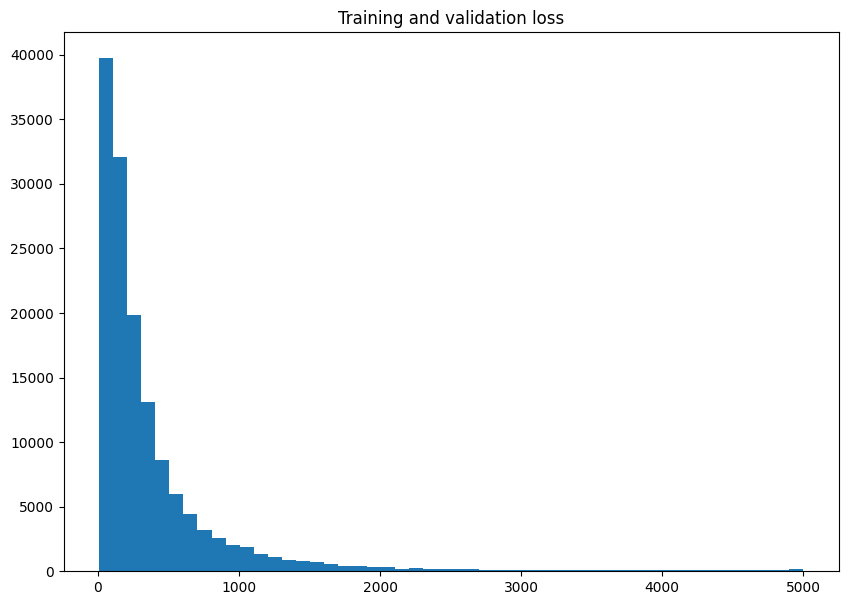

In [30]:
plt.hist(comments_length, bins=50)
plt.show()

In [31]:
print(comments_length.describe())

count    143613.000000
mean        393.703648
std         589.709844
min           6.000000
25%          96.000000
50%         205.000000
75%         435.000000
max        5000.000000
Name: comment_text, dtype: float64


In [32]:
comments_length.quantile(0.90)

889.0

In [9]:
max_length = 900
text_vectorization = keras.layers.TextVectorization(
    max_tokens=max_tokens,
    output_mode="int",
    output_sequence_length=max_length,
)
text_vectorization.adapt(text_only_train_ds)

int_train_ds = train_ds.map(
    lambda x, y: (text_vectorization(x), y),
    num_parallel_calls=4)
int_val_ds = valid_ds.map(
    lambda x, y: (text_vectorization(x), y),
    num_parallel_calls=4)
int_test_ds = test_ds.map(
    lambda x, y: (text_vectorization(x), y),
    num_parallel_calls=4)

In [94]:
text_vectorization.get_vocabulary()[:10]

['', '[UNK]', 'the', 'to', 'of', 'and', 'a', 'you', 'i', 'is']

In [34]:
inputs = keras.Input(shape=(None,), dtype="int64")
embedded = keras.layers.Embedding(input_dim=max_tokens, output_dim=256, mask_zero=True)(inputs)
x = keras.layers.Bidirectional(keras.layers.LSTM(32))(embedded)
x = keras.layers.Dropout(0.5)(x)
outputs = keras.layers.Dense(6, activation="sigmoid")(x)
model = keras.Model(inputs, outputs)
model.compile(optimizer="adam",
              loss="binary_crossentropy",
              metrics=[keras.metrics.Precision(),
                       keras.metrics.Recall(),
                       keras.metrics.BinaryAccuracy()])
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding (Embedding)       (None, None, 256)         2560000   
                                                                 
 bidirectional (Bidirectiona  (None, 64)               73984     
 l)                                                              
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 6)                 390       
                                                                 
Total params: 2,634,374
Trainable params: 2,634,374
Non-trainable params: 0
_________________________________________________

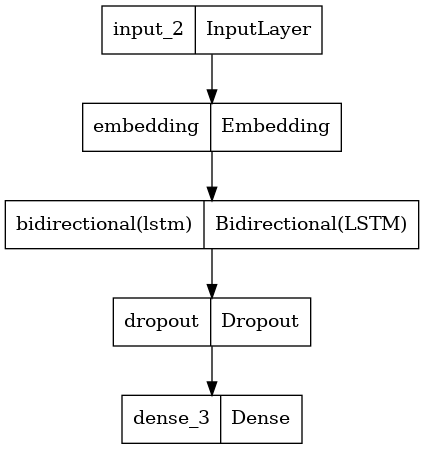

In [35]:
keras.utils.plot_model(model)

In [36]:
callback = [
    keras.callbacks.ModelCheckpoint("./models/data/bidirectional.keras",
                                    save_best=True,
                                    monitor='val_recall')
]
history = model.fit(int_train_ds,
                    validation_data=int_val_ds,
                    epochs=epoch,
                    callbacks=callback)

Epoch 1/5
4488/4488 [==============================] - 195s 42ms/step - loss: 0.0664 - precision_1: 0.7687 - recall_1: 0.5890 - binary_accuracy: 0.9783 - val_loss: 0.0459 - val_precision_1: 0.8246 - val_recall_1: 0.6478 - val_binary_accuracy: 0.9836
Epoch 2/5
4488/4488 [==============================] - 182s 41ms/step - loss: 0.0479 - precision_1: 0.8201 - recall_1: 0.6764 - binary_accuracy: 0.9826 - val_loss: 0.0452 - val_precision_1: 0.8251 - val_recall_1: 0.6471 - val_binary_accuracy: 0.9836
Epoch 3/5
4488/4488 [==============================] - 182s 41ms/step - loss: 0.0421 - precision_1: 0.8344 - recall_1: 0.7088 - binary_accuracy: 0.9841 - val_loss: 0.0464 - val_precision_1: 0.7993 - val_recall_1: 0.6727 - val_binary_accuracy: 0.9834
Epoch 4/5
4488/4488 [==============================] - 185s 41ms/step - loss: 0.0375 - precision_1: 0.8484 - recall_1: 0.7432 - binary_accuracy: 0.9856 - val_loss: 0.0489 - val_precision_1: 0.7863 - val_recall_1: 0.6883 - val_binary_accuracy: 0.9833


In [10]:
model = keras.models.load_model("./models/data/bidirectional.keras")
model.evaluate(int_test_ds)

250/250 [==============================] - 7s 18ms/step - loss: 0.0572 - precision_1: 0.7643 - recall_1: 0.6532 - binary_accuracy: 0.9808


[0.0572320781648159,
 0.7642956972122192,
 0.6531585454940796,
 0.9807830452919006]

In [87]:
bidir_pred = np.where(model.predict(int_test_ds) >= 0.5, 1, 0)
column_wise_metrics(bidir_pred)

Models accuracy vs baseline accuracy
toxic: 0.9582654467978443 vs 0.8349417220203033
severe_toxic: 0.9883444040606593 vs 0.9845845344028074
obscene: 0.977816769018674 vs 0.913147010903622
threat: 0.9968667752851235 vs 0.9951121694447925
insult: 0.9714249906003258 vs 0.9175335255044492
identity_hate: 0.991978944729916 vs 0.9887203910264444
********************************************************************************
Models precision vs baseline precision
toxic: 0.7919655667144907 vs 0.08608321377331421
severe_toxic: 0.3488372093023256 vs 0.0
obscene: 0.8249258160237388 vs 0.05934718100890208
threat: 0.7 vs 0.0
insult: 0.717391304347826 vs 0.049689440993788817
identity_hate: 0.52 vs 0.0
********************************************************************************
Model's recall vs baseline recall
toxic: 0.745945945945946 vs 0.08108108108108109
severe_toxic: 0.1875 vs 0.0
obscene: 0.702020202020202 vs 0.050505050505050504
threat: 0.2413793103448276 vs 0.0
insult: 0.6277173913043478 

In [12]:
log_dir = "./models/data/log_dir"
with open(os.path.join(log_dir, 'metadata.tsv'), "w") as f:
    for word in text_vectorization.get_vocabulary():
        f.write("{}\n".format(word))

In [23]:
weights = tf.Variable(model.layers[1].get_weights()[0][1:-2])
checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))

'./models/data/log_dir/embedding.ckpt-1'

In [24]:
config = projector.ProjectorConfig()
embedding = config.embeddings.add()

In [25]:
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(log_dir, config)

In [54]:
!tensorboard --logdir ./models/data/log_dir --host=0.0.0.0

2021-12-06 15:20:31.231570: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-06 15:20:31.236442: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-06 15:20:31.236808: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

TensorBoard 2.7.0 at http://0.0.0.0:6006/ (Press CTRL+C to quit)
^C


# Training models on generated data

In [55]:
train_df, valid_df = train_test_split(gen_data, train_size=0.9, random_state=1234)

In [56]:
tf_idf = TfidfVectorizer()
train_x = tf_idf.fit_transform(train_df.comment.to_numpy())
valid_x = tf_idf.transform(valid_df.comment.to_numpy())
train_y = train_df.label.to_numpy()
valid_y = valid_df.label.to_numpy()
print(train_x.shape, valid_x.shape, train_y.shape, valid_y.shape)

(9000, 20000) (1000, 20000) (9000,) (1000,)


In [57]:
nb = MultinomialNB()
nb.fit(train_x, train_y)
nb_preds = nb.predict(valid_x)

In [58]:
print(accuracy_score(valid_y, nb_preds))

0.999


In [59]:
expl = LimeTextExplainer(class_names=nb.classes_)

In [60]:
t1 = valid_df[valid_df['label'] == 0]["comment"].iloc[0]
t2 = valid_df[valid_df['label'] == 1]["comment"].iloc[0]
print(t1)
print("*" * 50)
print(t2)

storyline to insight lot or something prudent club box considering if lakoff not although fall often spin found the islamic available crooked policing archive censor happy ready maps is making later we is greek so kiwi bother 1526 file until behaviors ticket provide 30 biased diligent tiptoety at terms editor used 17 concert pronounce replacement admitted instructor notification warred not dates ears last abusing continues eligible tense editing an sure smelly anthems talk cannister subject even car people familiar developed wagner visit trilogy guess notice against 131 error israeli just more what european there to ooooh things do thousand this him what country user also rule ve oklahoma anymore all pity fiction nableezy preceding secondly the an world on concerns oi merger area in of months columbia disputing test contributed at tossed might melech clear course thank avatar media articles to 2011 informative it too changing www 99 jack magical id undisputed an lest unnecessary reinse

In [61]:
pipeline = make_pipeline(tf_idf, nb)
exp = expl.explain_instance(t1, pipeline.predict_proba, num_features=5)
exp.show_in_notebook(text=True)

In [62]:
exp = expl.explain_instance(t2, pipeline.predict_proba, num_features=5)
exp.show_in_notebook(text=True)

In [27]:
train_ds = tf.data.Dataset.from_tensor_slices((train_x.todense(), train_y)).batch(32)
valid_ds = tf.data.Dataset.from_tensor_slices((valid_x.todense(), valid_y)).batch(32)

In [28]:
inputs = keras.Input(shape=(20_000,))
x = keras.layers.Dense(64, activation='relu')(inputs)
x = keras.layers.Dense(64, activation='relu')(x)
output = keras.layers.Dense(1, activation='sigmoid')(x)
model = keras.Model(inputs, output)
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=[keras.metrics.BinaryAccuracy()])
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 20000)]           0         
                                                                 
 dense_6 (Dense)             (None, 64)                1280064   
                                                                 
 dense_7 (Dense)             (None, 64)                4160      
                                                                 
 dense_8 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,284,289
Trainable params: 1,284,289
Non-trainable params: 0
_________________________________________________________________


In [29]:
model.fit(train_ds, validation_data=valid_ds, epochs=5)

Epoch 1/5
282/282 [==============================] - 3s 6ms/step - loss: 0.1278 - binary_accuracy: 0.9782 - val_loss: 0.0130 - val_binary_accuracy: 0.9970
Epoch 2/5
282/282 [==============================] - 2s 6ms/step - loss: 0.0019 - binary_accuracy: 0.9998 - val_loss: 0.0108 - val_binary_accuracy: 0.9970
Epoch 3/5
282/282 [==============================] - 2s 5ms/step - loss: 3.3916e-04 - binary_accuracy: 1.0000 - val_loss: 0.0098 - val_binary_accuracy: 0.9980
Epoch 4/5
282/282 [==============================] - 1s 5ms/step - loss: 1.7300e-04 - binary_accuracy: 1.0000 - val_loss: 0.0092 - val_binary_accuracy: 0.9980
Epoch 5/5
282/282 [==============================] - 1s 5ms/step - loss: 1.0383e-04 - binary_accuracy: 1.0000 - val_loss: 0.0088 - val_binary_accuracy: 0.9980


In [46]:
model.evaluate(valid_ds)

32/32 [==============================] - 0s 3ms/step - loss: 0.0088 - binary_accuracy: 0.9980


[0.008832266554236412, 0.9980000257492065]